In [1]:
# Navigate to the root of the project and import necessary libraries
from hydra import initialize, compose
initialize(config_path="../confs", job_name="notebook")

import sys
import os
from pathlib import Path

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

sys.path.append(os.path.abspath("../src"))
# We change the working directory to the root of the project
# Run this only once
root_path = Path.cwd().parent
os.chdir(root_path)
sys.path.append(root_path / "src")

device = 'cpu'

/tmp/ipykernel_93876/451883383.py:3: UserWarning: 
The version_base parameter is not specified.
Please specify a compatability version level, or None.
Will assume defaults for version 1.1
  initialize(config_path="../confs", job_name="notebook")


## Computation of the HOG descriptor

This notebook explains how we compute the HOG descriptor to match the different patches to characters. Let's begin by loading the actual patches:

In [2]:
from src.ocr.patch_extraction import extract_patches
from src.utils import connectedComponent, torch_to_pil
from PIL import Image
import torch

from src.data.patch_database import PatchDatabase

database = PatchDatabase.load('data/datasets/databases/book1')

img_np = database._images[0]
img_comp = database._components[0]

import cv2
img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)[..., None]
img_np.shape

Rebuilt database from saved files: 473 patches, 1 components


(3510, 4799, 1)

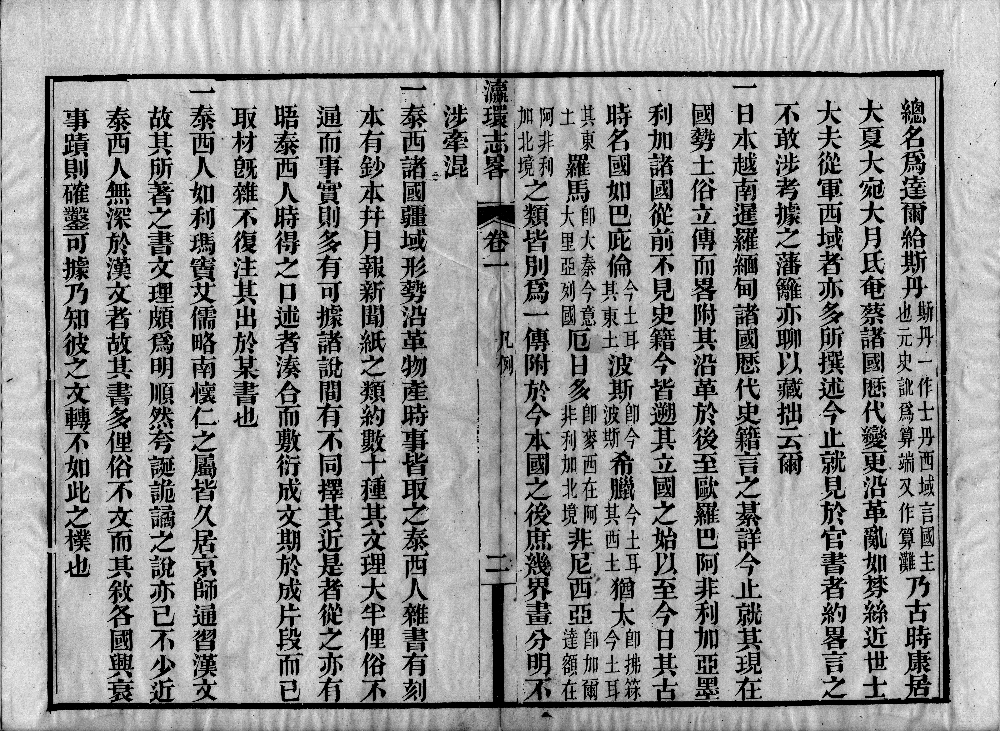

In [18]:
torch_to_pil(img_torch)

- Calculer les gradients en utilisant la scale appropriée (c'est quoi la scale ?)
- Weight sur la magnitude des gradients -> Gaussian, sigma = window / 2
- Cells de 4x4 dans l'implémentation de base
- On ajoute à l'histogramme avec une interpolation trilinéaire: on ajoute au bin avec un poids dépendant de la distance avec le centre du bin
- On forme le vecteur
- On le normalise à un vecteur unité
- On threshold les valeurs de ce vecteur à 0.2 max et renormalise
- 

In [4]:
database._images[0].shape[-1]

3

In [3]:
from src.character_linking.feature_matching import HOG, HOGParameters, featureMatching, featureMatchingParameters
from einops import rearrange



hog_params = HOGParameters(
    device          = "cuda",
    C               = img_np.shape[-1], # use WB images
    partial_output  = False,
    method          = 'gaussian',
    grdt_sigma      = 2.5,
    ksize_factor    = 6,
    cell_height     = 16,
    cell_width      = 16,
    psize           = 112,
    num_bins        = 16,
    sigma           = 100, # almost like desactivating the weighting
    threshold       = 0.2
)

hog = HOG(hog_params)


hist_list = []
for i in range(len(database._images[:3])):
    img_np = database._images[i]
    img_comp = database._components[i]

    import cv2
    img_np = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)[..., None]
    img_torch = torch.tensor(img_np, device="cuda").permute(2,0,1).to(dtype=torch.float32) / 255
    img_torch.requires_grad = False

    hog_output = hog(img_torch, img_comp)

    # We have one HOG descriptor per patch per color channel -> transform it to C * Ncells cells

    histograms = rearrange(hog_output.histograms, 'Npatch C Ncells Nbins -> Npatch (C Ncells) Nbins')
    hist_list.append(histograms)
histograms = torch.cat(hist_list, dim=0)
# cs = 1 - torch.logspace(-3, 0, 100)
# matches_len = []
# for c in cs:
#     eps = 1 - torch.pow(torch.tensor(c), 1 / 4 * len(img_comp.regions) / 473)
#     featureMatching_params = featureMatchingParameters(
#         metric          = "CEMD",
#         epsilon         = eps,
#         reciprocal_only = True,
#         partial_output  = False
#     )
#     feature_matcher = featureMatching(featureMatching_params)
#     # Match the histograms
#     try:
#         matches = feature_matcher(
#             query_histograms=histograms,
#             key_histograms=histograms
#         )
#         matches_len.append(len(matches.match_indices))
#     except:
#         matches_len.append(0)

# idx = (np.array(matches_len) != 0).argmax()
# c = cs[idx]
# plt.scatter(cs, matches_len)
# plt.xscale('log')
# plt.yscale('log')



# c = 0.978455662727356
# eps = 1 - torch.pow(torch.tensor(c), 1 / 4 * len(img_comp.regions) / 473)

eps = .005
featureMatching_params = featureMatchingParameters(
    metric          = "CEMD",
    epsilon         = eps,
    reciprocal_only = True,
    partial_output  = False
)

feature_matcher = featureMatching(featureMatching_params)

# Match the histograms

matches = feature_matcher(
    query_histograms=histograms,
    key_histograms=histograms
)



print('Outputs:')
print(hog_output.__dict__.keys())
print(matches.__dict__.keys())


extracted_image_patches = hog_output.patches_image
match_indices = matches.match_indices

D = matches.total_dissimilarities

print('Number of matches:', len(match_indices))

Batch size :  110
Batch size :  109
Outputs:
dict_keys(['dx', 'dy', 'patches_grdt_magnitude', 'patches_grdt_orientation', 'patches_image', 'histograms'])
dict_keys(['match_indices', 'deltas', 'total_dissimilarities', 'deltas2', 'total_dissimilarities2'])
Number of matches: 1955


Visualizing patch 220
Grid: 7 x 7 cells, each with 16 orientation bins
Cell size: 16 x 16 pixels


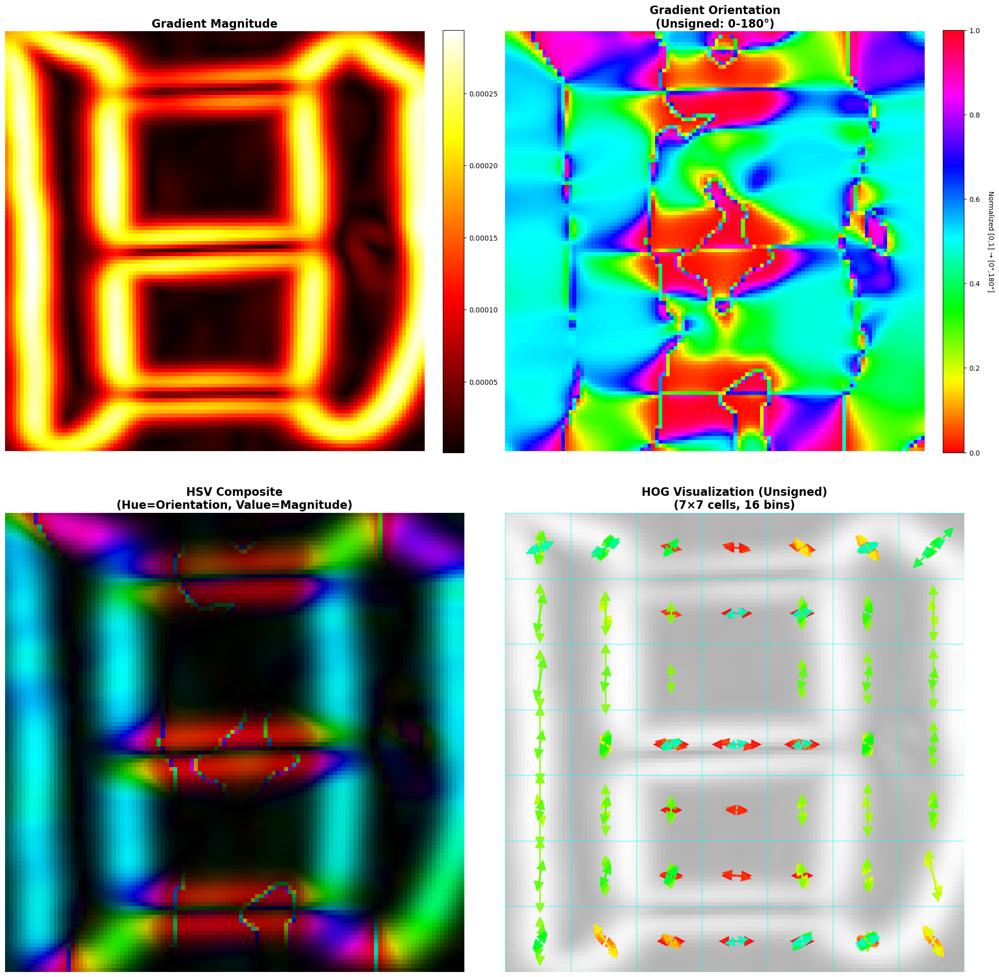


Histogram Statistics:
  Min: 0.0000
  Max: 0.0172
  Mean: 0.0008
  L2 norm: 0.0612


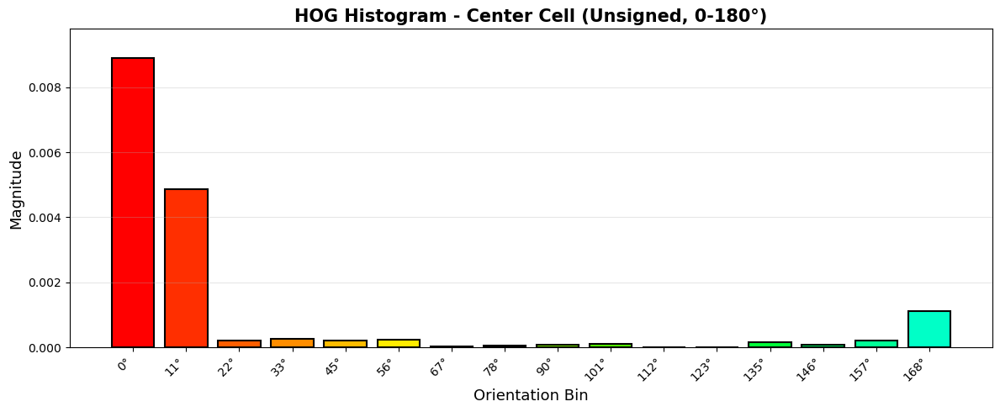

In [10]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import hsv_to_rgb

# Get parameters
cw = hog._params.cell_width
ch = hog._params.cell_height
Nw = hog._params.psize // cw
Nh = hog._params.psize // ch 
Nbins = histograms.shape[-1]

# Reshape histograms to spatial grid
scales = rearrange(histograms, 'Npatchs (Nh Nw) Nbins -> Npatchs Nh Nw Nbins', Nw=Nw, Nh=Nh).cpu()

# Select a random patch
# i = np.random.randint(0, len(hog_output.patches_grdt_magnitude))
# i = 98
i = 220
selected_histograms = scales[i]

print(f"Visualizing patch {i}")
print(f"Grid: {Nh} x {Nw} cells, each with {Nbins} orientation bins")
print(f"Cell size: {ch} x {cw} pixels")

# Create figure with 4 subplots
fig, axes = plt.subplots(2, 2, figsize=(20, 20))

# 1. Gradient Magnitude
ax1 = axes[0, 0]
im1 = ax1.imshow(hog_output.patches_grdt_magnitude[i].cpu().detach()[0], cmap='hot')
ax1.set_title('Gradient Magnitude', fontsize=16, fontweight='bold')
ax1.axis('off')
plt.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)

# 2. Gradient Orientation (unsigned)
ax2 = axes[0, 1]
im2 = ax2.imshow(hog_output.patches_grdt_orientation[i].cpu().detach()[0], cmap='hsv', vmin=0, vmax=1)
ax2.set_title('Gradient Orientation\n(Unsigned: 0-180°)', fontsize=16, fontweight='bold')
ax2.axis('off')
cbar2 = plt.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)
cbar2.set_label('Normalized [0,1] → [0°,180°]', rotation=270, labelpad=20)

# 3. HSV Composite (Hue = Orientation, Value = Magnitude)
ax_hsv = axes[1, 0]
gradient_magnitude = hog_output.patches_grdt_magnitude[i].cpu().detach()[0].numpy()
gradient_orientation = hog_output.patches_grdt_orientation[i].cpu().detach()[0].numpy()

# Normalize magnitude to [0, 1] for the Value channel
magnitude_normalized = gradient_magnitude / gradient_magnitude.max() if gradient_magnitude.max() > 0 else gradient_magnitude

# Create HSV image
# H: orientation (0-180° maps to 0-0.5 in HSV color wheel for unsigned gradients)
# S: full saturation
# V: gradient magnitude
hsv_image = np.zeros((*gradient_orientation.shape, 3))
hsv_image[..., 0] = gradient_orientation  # Map [0,1] to [0,0.5] for 0-180°
hsv_image[..., 1] = 1.0  # Full saturation
hsv_image[..., 2] = magnitude_normalized  # Magnitude as brightness

# Convert to RGB
rgb_image = hsv_to_rgb(hsv_image)

im_hsv = ax_hsv.imshow(rgb_image)
ax_hsv.set_title('HSV Composite\n(Hue=Orientation, Value=Magnitude)', 
                 fontsize=16, fontweight='bold')
ax_hsv.axis('off')

# 4. HOG Histogram Visualization
ax3 = axes[1, 1]
ax3.imshow(hog_output.patches_grdt_magnitude[i].cpu().detach()[0], cmap='gray', alpha=0.3)

# UNSIGNED: angles from 0 to π
bin_angles = np.linspace(0, np.pi, Nbins, endpoint=False)

max_magnitude = selected_histograms.max()

for cell_y in range(Nh):
    for cell_x in range(Nw):
        center_x = (cell_x + 0.5) * cw
        center_y = (cell_y + 0.5) * ch
        
        cell_hist = selected_histograms[cell_y, cell_x]
        
        for bin_idx, magnitude in enumerate(cell_hist):
            if magnitude > 0.05 * max_magnitude:
                angle = bin_angles[bin_idx]
                
                # Arrow properties
                length = magnitude * min(cw, ch) * 0.45 / max_magnitude
                dx = length * np.cos(angle)
                dy = length * np.sin(angle)
                
                # Color: map [0, π] to [0, 0.5] in HSV (to use half the color wheel)
                color = plt.cm.hsv(angle / (2*np.pi))
                
                # Draw BIDIRECTIONAL arrows for unsigned gradients
                ax3.arrow(center_x, center_y, dx, dy,
                         head_width=2.0, head_length=2.0, 
                         fc=color, ec=color, alpha=0.85, linewidth=2.0)
                ax3.arrow(center_x, center_y, -dx, -dy,
                         head_width=2.0, head_length=2.0, 
                         fc=color, ec=color, alpha=0.85, linewidth=2.0)

# Grid lines
for i in range(Nh + 1):
    ax3.axhline(y=i * ch - 0.5, color='cyan', linewidth=1.0, alpha=0.6)
for i in range(Nw + 1):
    ax3.axvline(x=i * cw - 0.5, color='cyan', linewidth=1.0, alpha=0.6)

ax3.set_xlim(-0.5, Nw * cw - 0.5)
ax3.set_ylim(Nh * ch - 0.5, -0.5)
ax3.set_title(f'HOG Visualization (Unsigned)\n({Nh}×{Nw} cells, {Nbins} bins)', 
              fontsize=16, fontweight='bold')
ax3.axis('off')

plt.tight_layout()
plt.show()

# Statistics
print(f"\nHistogram Statistics:")
print(f"  Min: {selected_histograms.min():.4f}")
print(f"  Max: {selected_histograms.max():.4f}")
print(f"  Mean: {selected_histograms.mean():.4f}")
print(f"  L2 norm: {np.linalg.norm(selected_histograms):.4f}")

# Bar chart for center cell
example_cell_y, example_cell_x = Nh // 2, Nw // 2
example_hist = selected_histograms[example_cell_y, example_cell_x]

fig, ax = plt.subplots(figsize=(12, 5))
bin_angles_deg = np.linspace(0, 180, Nbins, endpoint=False)
colors = [plt.cm.hsv(a/360) for a in bin_angles_deg]  # Map to first half of HSV

bars = ax.bar(range(Nbins), example_hist, color=colors,
              edgecolor='black', linewidth=1.5)
ax.set_xlabel('Orientation Bin', fontsize=13)
ax.set_ylabel('Magnitude', fontsize=13)
ax.set_title(f'HOG Histogram - Center Cell (Unsigned, 0-180°)', 
             fontsize=15, fontweight='bold')
ax.set_xticks(range(Nbins))
ax.set_xticklabels([f'{int(a)}°' for a in bin_angles_deg], rotation=45, ha='right')
ax.grid(axis='y', alpha=0.3)
ax.set_ylim(0, example_hist.max() * 1.1)
plt.tight_layout()
plt.show()

In [ ]:
hog_output.

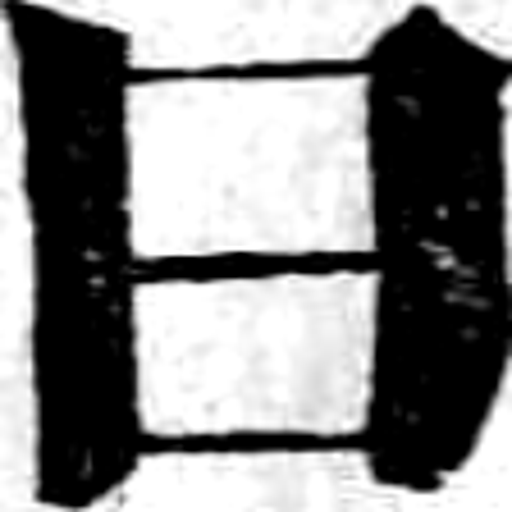

In [11]:
i = 220
torch_to_pil(hog_output.patches_image[i]).resize((512,512))

## Circular Earth Mover Distance (CEMD)

**Based on [this paper](https://hal.science/hal-00168285/document)**.

The Earth Mover Distance is the Wasserstein-1 metric, which compares two probability measures $\mu$ and $\nu$. In the general case, given a metric space $(M, c)$, it is formulated as $W_1(\mu, \nu) = \inf \limits_{\gamma \in \Gamma(\mu, \nu)} \mathbb{E}_{(x,y)\sim\gamma}\left[ c(x, y)\right]$, where $\Gamma(\mu, \nu)$ is the set of all couplings between $\mu$ and $\nu$. For two discrete histograms $f$ and $g$ with $N$ bins, their EMD is defined as $\text{EMD}(f, g) = \min_{\alpha_{i, j} \in \mathcal{M}} \sum \limits_{i=1}^N \sum \limits_{j=1}^N \alpha_{i,j} c(i, j)$, with $\mathcal{M}$ the set of all couplings between $f$ and $g$.

For circular histograms, we use:
$$c(i,j) = \frac{1}{N} \min(|i-j|, N - |i-j|), \quad \forall (i,j) \in \{1, \ldots N\}^2.$$

When the distance is $c(i, j) = \frac{1}{N} | i-j |$ (non-circular case), it is well-known that EMD equals the $\ell_1$ distance between cumulative histograms: $\text{EMD}(f, g) = \|F - G\|_1 = \frac{1}{N}\sum_{i=1}^N |F[i] - G[i]|$, where $F[i] = \sum_{j=1}^i f[j]$ and $G[i] = \sum_{j=1}^i g[j]$.

Rabin et al. proved that for circular histograms with the circular ground distance, the Circular Earth Mover's Distance (CEMD) can be efficiently computed as:

$$\text{CEMD}(f, g) = \min_{k \in \{1,\ldots N\}} \|F_k - G_k\|_1$$

where $F_k$ and $G_k$ are cumulative histograms of $f$ and $g$ starting at the $k$-th bin.

## Statistical test for descriptor matching

**Based on [this paper](https://hal.science/hal-00168285/document) and ideas by Aitor Artola**

### Framework and notation

Let $a^i = (a^i_1, \ldots, a^i_M)$ and $b = (b_1, \ldots, b_M)$ be two descriptor vectors with $M$ components (e.g., histograms).

**Global dissimilarity measure**:
$$D(a^i, b) = \sum_{m=1}^{M} d(a^i_m, b_m)$$
where $d(\cdot, \cdot)$ is a dissimilarity measure between components (Euclidean distance, Circular Earth Mover Distance, etc.).

### Null hypothesis

**$\mathcal{H}_0^i$**: The random variables $\{d(a^i_m, b_m)\}_{m=1}^M$ are mutually independent.

Under this hypothesis, each $d(a^i_m, b_m)$ is a random variable with density $p_m$, mean $\mu_m$, and variance $\sigma_m^2$.

### Probability under the null hypothesis

The probability that the global dissimilarity is below a threshold $\delta$ is:
$$\mathbb{P}\left(D(a^i, b) \leq \delta \mid \mathcal{H}_0^i\right) = \mathbb{P}\left(\sum_{m=1}^{M} d(a^i_m, b_m) \leq \delta\right)$$

This probability corresponds to the cumulative distribution function of the sum of independent random variables:
$$\mathbb{P}\left(D(a^i, b) \leq \delta \mid \mathcal{H}_0^i\right) = (p_1 * p_2 * \cdots * p_M)(\delta)$$
where $*$ denotes convolution.

### Normal approximation (CLT)

**Theorem (Lindeberg-Feller CLT)**: Let $X_m = d(a^i_m, b_m)$ be independent random variables with $\mathbb{E}[X_m] = \mu_m$ and $\text{Var}(X_m) = \sigma_m^2$. Define:
$$S_M = \sum_{m=1}^M X_m, \quad s_M^2 = \sum_{m=1}^M \sigma_m^2$$

Under appropriate regularity conditions (Lindeberg condition and Feller condition), we have:
$$\frac{S_M - \mathbb{E}[S_M]}{s_M} = \frac{\sum_{m=1}^M (X_m - \mu_m)}{s_M} \xrightarrow[\text{dist}]{M \to \infty} \mathcal{N}(0, 1)$$

**In practice**, for fixed and sufficiently large $M$, under $\mathcal{H}_0^i$:
$$D(a^i, b) \approx \mathcal{N}\left(\mu_{\text{tot}}, \sigma_{\text{tot}}^2\right)$$
with $\mu_{\text{tot}} = \sum_{m=1}^M \mu_m$ and $\sigma_{\text{tot}}^2 = \sum_{m=1}^M \sigma_m^2$ (finite quantities).

This approximation is justified when:
1. The $d(a^i_m, b_m)$ are independent
2. The Feller condition is verified
3. $M$ is large enough for the normal approximation to be accurate

### Statistical test

We compute the $p$-value:
$$p\text{-value} = \mathbb{P}\left(D(a^i, b) \leq \delta_{\text{obs}} \mid \mathcal{H}_0^i\right) \approx \Phi\left(\frac{\delta_{\text{obs}} - \mu_{\text{tot}}}{\sigma_{\text{tot}}}\right)$$
where $\Phi$ is the cumulative distribution function of the standard normal distribution.

We reject $\mathcal{H}_0^i$ (the descriptors do not match) if this $p$-value is too low. When comparing $N_Q$ query descriptors against $N_C$ candidates, the matching threshold for a given $\varepsilon > 0$ is obtained by finding the largest $\delta$ such that:
$$\Phi\left(\frac{\delta - \mu_{\text{tot}}}{\sigma_{\text{tot}}}\right) \leq \frac{\varepsilon}{N_Q N_C}$$

Since $\Phi$ is monotonically increasing, this gives:
$$\frac{\delta_i(\varepsilon) - \mu_{\text{tot}}}{\sigma_{\text{tot}}} = \Phi^{-1}\left(\frac{\varepsilon}{N_Q N_C}\right)$$

Therefore:
$$\delta_i(\varepsilon) = \mu_{\text{tot}} + \sigma_{\text{tot}} \cdot \Phi^{-1}\left(\frac{\varepsilon}{N_Q N_C}\right)$$

A match between $a^i$ and $b^j$ is **$\varepsilon$-meaningful** if $D(a^i, b^j) \leq \delta_i(\varepsilon)$. Under $\mathcal{H}_0^i$, the expected number of $\varepsilon$-meaningful matches is bounded by $\varepsilon$.

2025-11-07 15:42:41.408 | WARNING  | fitter.fitter:_fit_single_distribution:337 - SKIPPED lognormal distribution (taking more than 30 seconds)
2025-11-07 15:42:44.506 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted norm distribution with error=151.693547)
2025-11-07 15:42:46.693 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted gamma distribution with error=136.868219)
2025-11-07 15:42:49.255 | INFO     | fitter.fitter:_fit_single_distribution:333 - Fitted chi2 distribution with error=116.917322)
2025-11-07 15:42:49.367 | WARNING  | fitter.fitter:plot_pdf:419 - lognormal was not fitted. no parameters available
2025-11-07 15:42:49.378 | WARNING  | fitter.fitter:plot_pdf:419 - lognormal was not fitted. no parameters available


           sumsquare_error         aic         bic  kl_div  ks_statistic  \
chi2            116.917322  451.184622  482.139194     inf      0.042796   
gamma           136.868219  419.285459  450.240032     inf      0.041932   
norm            151.693547  424.650636  445.287018     inf      0.045784   
lognormal              inf         inf         inf     inf           NaN   

           ks_pvalue  
chi2             0.0  
gamma            0.0  
norm             0.0  
lognormal        NaN  


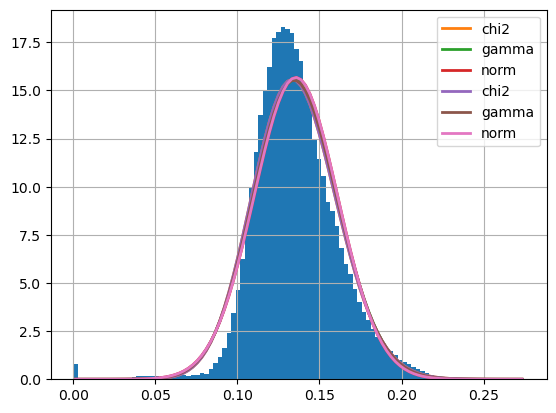

In [14]:
from fitter import Fitter

# Fit data to common distributions
f = Fitter(D, distributions=['norm', 'chi2', 'gamma', 'lognormal'])
f.fit()

# Get summary of best fits
print(f.summary())

# Plot results
f.plot_pdf()
plt.show()

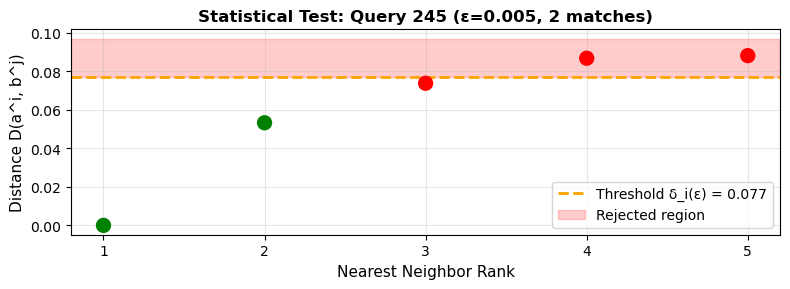

/tmp/ipykernel_77023/2128901407.py:79: UserWarning: Glyph 10060 (\N{CROSS MARK}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


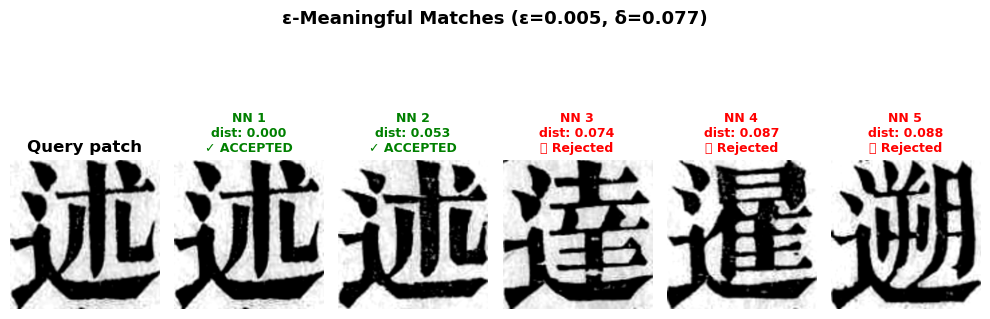

In [18]:
# Pick a random query
matches.deltas

i = np.random.randint(0, len(extracted_image_patches))

# Get all matches for query i from the statistical test
query_matches = match_indices[match_indices[:, 0] == i][:, 1]  # Candidate indices that match query i

# Compute distances from query i to all candidates
D_i = D[i].detach().cpu().numpy()  # Distance to all N2 candidates

# Get sorted candidate indices by distance (nearest first)
sorted_indices = np.argsort(D_i)
sorted_distances = D_i[sorted_indices]

# Determine which are accepted (ε-meaningful matches)
n_to_show = min(5, len(extracted_image_patches))
accepted_mask = np.isin(sorted_indices[:n_to_show], query_matches.cpu().numpy())

# Plot distances with color coding
plt.figure(figsize=(8, 3))
colors = ['green' if accepted else 'red' for accepted in accepted_mask]
plt.scatter(range(1, n_to_show + 1), sorted_distances[:n_to_show], c=colors, s=100, zorder=3)

# Add threshold line
delta = matches.deltas.cpu()
thresh_value = delta[i].item()
plt.axhline(y=thresh_value, color='orange', linestyle='--', linewidth=2, 
            label=f'Threshold δ_i(ε) = {thresh_value:.3f}')

# Shade rejected region
plt.axhspan(thresh_value, sorted_distances[:n_to_show].max() * 1.1, alpha=0.2, 
            color='red', label='Rejected region')

plt.xlabel('Nearest Neighbor Rank', fontsize=11)
plt.ylabel('Distance D(a^i, b^j)', fontsize=11)
plt.title(f'Statistical Test: Query {i} (ε={eps}, {len(query_matches)} matches)', 
          fontsize=12, fontweight='bold')
plt.xticks(range(1, n_to_show + 1))
plt.grid(alpha=0.3)
plt.legend()
plt.tight_layout()
plt.show()

# Visualize patches with acceptance/rejection status
fig, axs = plt.subplots(1, n_to_show + 1, figsize=(10, 4), sharex=True, sharey=True)

# Reference patch (query)
ax = axs[0]
ax.imshow(torch_to_pil(extracted_image_patches[i]).resize((256, 256)), cmap="gray")
ax.set_title('Query patch', fontweight='bold')
ax.axis('off')

# Nearest neighbors with acceptance/rejection status
for j in range(n_to_show):
    candidate_idx = sorted_indices[j]
    distance = sorted_distances[j]
    
    ax = axs[j + 1]
    ax.imshow(torch_to_pil(extracted_image_patches[candidate_idx]).resize((256, 256)), cmap="gray")
    
    # Determine if this neighbor is accepted
    is_accepted = accepted_mask[j]
    status = '✓ ACCEPTED' if is_accepted else '❌ Rejected'
    color = 'green' if is_accepted else 'red'
    
    ax.set_title(f'NN {j+1}\ndist: {distance:.3f}\n{status}', 
                 fontweight='bold', color=color, fontsize=9)
    ax.axis('off')
    
    # Add colored border
    for spine in ax.spines.values():
        spine.set_edgecolor(color)
        spine.set_linewidth(3)
        spine.set_visible(True)

plt.suptitle(f'ε-Meaningful Matches (ε={eps}, δ={thresh_value:.3f})', 
             fontsize=13, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

Detected N = 473 descriptors (not N1=473)
Distance matrix shape: torch.Size([473, 473])
Match indices shape: torch.Size([1955, 2])
Computing UMAP embedding...


/home/mathis/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1865: UserWarning: using precomputed metric; inverse_transform will be unavailable
  warn("using precomputed metric; inverse_transform will be unavailable")
/home/mathis/anaconda3/lib/python3.12/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


Building graph...
Detecting communities...
Graph: 473 nodes, 741 edges, 212 communities
Showing all 473 patches
Available patches: 473
Using display size: 32px, zoom: 0.6
Drawing edges by community...
  734 intra-community edges
  7 inter-community edges
Adding patches...


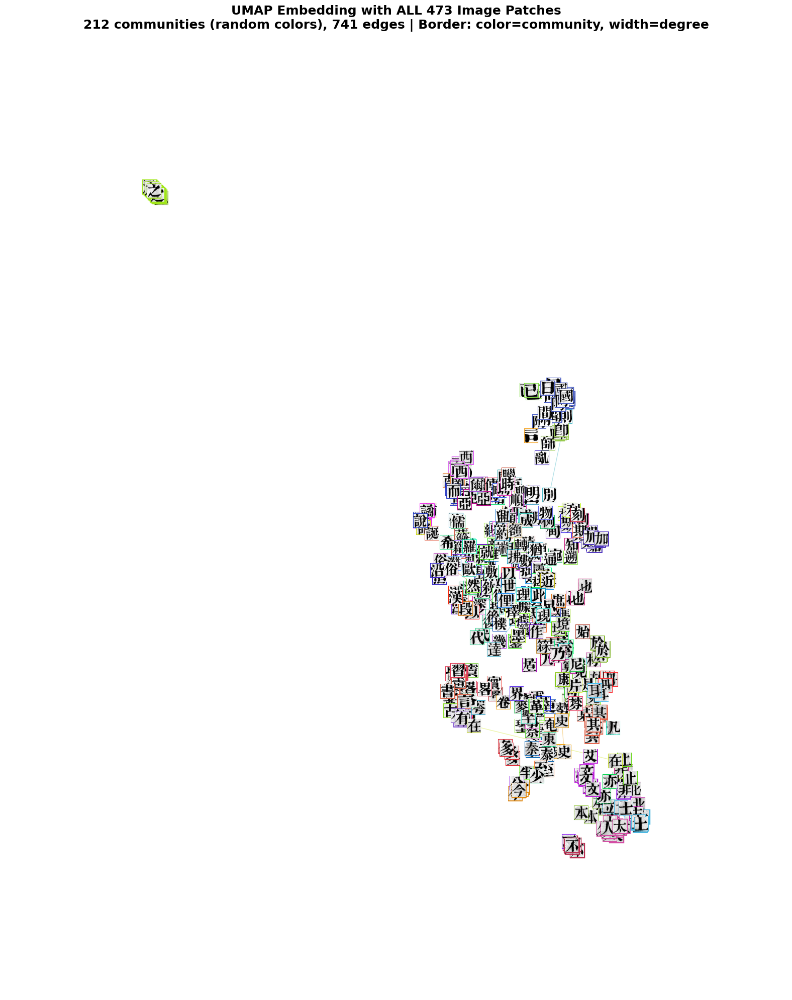

✓ All 473 patches displayed with 212 random community colors

Largest communities:
  1. Community 0: 23 nodes
  2. Community 1: 18 nodes
  3. Community 2: 14 nodes
  4. Community 3: 14 nodes
  5. Community 4: 13 nodes
  6. Community 5: 12 nodes
  7. Community 6: 9 nodes
  8. Community 7: 9 nodes
  9. Community 8: 9 nodes
  10. Community 9: 8 nodes
  ... and 202 more communities


In [19]:
# ============================================
# UMAP with ALL Image Patches - Fixed N calculation
# ============================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import networkx as nx
from umap import UMAP
import random

# Determine actual number of nodes from match_indices and distance matrix
if len(match_indices) > 0:
    max_query_idx = match_indices[:, 0].max().item()
    max_candidate_idx = match_indices[:, 1].max().item()
    N = max(max_query_idx, max_candidate_idx) + 1
else:
    N = D.shape[0]


N1, N2 = D.shape

print(f"Detected N = {N} descriptors (not N1={N1})")
print(f"Distance matrix shape: {D.shape}")
print(f"Match indices shape: {match_indices.shape}")

# Verify the distance matrix matches
assert D.shape[0] == N and D.shape[1] == N, f"Distance matrix shape mismatch: {D.shape} vs N={N}"

# Compute UMAP embedding
print("Computing UMAP embedding...")
distance_matrix = D.cpu().numpy()
umap_reducer = UMAP(n_components=2, metric='precomputed', 
                   n_neighbors=min(15, N-1), random_state=42)
coords_umap = umap_reducer.fit_transform(np.exp(distance_matrix))

# Build graph
print("Building graph...")
G = nx.Graph()
G.add_nodes_from(range(N))
edges = [(int(i.item()), int(j.item())) for i, j in match_indices if i != j]
G.add_edges_from(edges)

# Compute degrees
degrees = np.array([G.degree(i) for i in range(N)])

# Detect communities
print("Detecting communities...")
if G.number_of_edges() > 0:
    from networkx.algorithms import community
    communities = list(community.greedy_modularity_communities(G))
else:
    communities = [[i] for i in range(N)]

# Create node -> community mapping
community_map = {}
for comm_idx, comm in enumerate(communities):
    for node in comm:
        community_map[int(node)] = comm_idx

node_communities = np.array([community_map.get(i, 0) for i in range(N)])

print(f"Graph: {N} nodes, {G.number_of_edges()} edges, {len(communities)} communities")

# Generate random distinct colors for communities
def get_random_colors(n, seed=42):
    """Generate n random but distinct colors"""
    random.seed(seed)
    np.random.seed(seed)
    
    colors = []
    for _ in range(n):
        hue = random.random()
        saturation = 0.6 + random.random() * 0.4
        value = 0.7 + random.random() * 0.3
        
        import colorsys
        r, g, b = colorsys.hsv_to_rgb(hue, saturation, value)
        colors.append([r, g, b, 1.0])
    
    return np.array(colors)

n_communities = len(communities)
community_colors = get_random_colors(n_communities)

# ============================================
# Visualization
# ============================================

indices_to_show = np.arange(N)
print(f"Showing all {N} patches")

# Check if we have enough patches
print(f"Available patches: {len(extracted_image_patches)}")
assert len(extracted_image_patches) >= N, f"Not enough patches! Have {len(extracted_image_patches)}, need {N}"

# Adjust patch display size based on number of patches
if N < 50:
    display_size = 64
    zoom = 1.0
elif N < 200:
    display_size = 48
    zoom = 0.8
elif N < 500:
    display_size = 32
    zoom = 0.6
else:
    display_size = 24
    zoom = 0.5

print(f"Using display size: {display_size}px, zoom: {zoom}")

# Create figure with high DPI for better rendering
fig, ax = plt.subplots(figsize=(24, 20), dpi=100)

# Draw edges colored by community
show_edges = G.number_of_edges() < 2000
if show_edges:
    print("Drawing edges by community...")
    
    intra_community_edges = {i: [] for i in range(n_communities)}
    inter_community_edges = []
    
    for i, j in G.edges():
        comm_i = community_map.get(int(i), -1)
        comm_j = community_map.get(int(j), -1)
        
        if comm_i == comm_j and comm_i >= 0:
            intra_community_edges[comm_i].append((i, j))
        else:
            inter_community_edges.append((i, j))
    
    # Draw intra-community edges
    for comm_idx, edges_list in intra_community_edges.items():
        if len(edges_list) > 0:
            color = community_colors[comm_idx]
            for i, j in edges_list:
                ax.plot([coords_umap[i, 0], coords_umap[j, 0]], 
                       [coords_umap[i, 1], coords_umap[j, 1]], 
                       color=color, alpha=0.4, linewidth=1.0, zorder=1)
    
    # Draw inter-community edges
    for i, j in inter_community_edges:
        ax.plot([coords_umap[i, 0], coords_umap[j, 0]], 
               [coords_umap[i, 1], coords_umap[j, 1]], 
               'lightgray', alpha=0.1, linewidth=0.3, zorder=0)
    
    print(f"  {sum(len(e) for e in intra_community_edges.values())} intra-community edges")
    print(f"  {len(inter_community_edges)} inter-community edges")

# Add all patches
print("Adding patches...")
for idx in indices_to_show:
    # Get patch as PIL image  
    patch = extracted_image_patches[idx]
    pil_img = torch_to_pil(patch).resize((display_size, display_size), Image.Resampling.LANCZOS)
    
    # Create OffsetImage with proper zoom
    imagebox = OffsetImage(pil_img, zoom=zoom, cmap='gray')
    
    # Border color by community
    comm_idx = community_map.get(idx, 0)
    border_color = community_colors[comm_idx]
    
    # Border width by degree
    if len(degrees[degrees > 0]) > 0:
        degree_percentile = np.percentile(degrees[degrees > 0], [50, 80])
        if degrees[idx] > degree_percentile[1]:
            border_width = 2.5
        elif degrees[idx] > degree_percentile[0]:
            border_width = 2.0
        else:
            border_width = 1.5
    else:
        border_width = 1.5
    
    # Create AnnotationBbox at UMAP coordinates
    ab = AnnotationBbox(
        imagebox, 
        (coords_umap[idx, 0], coords_umap[idx, 1]),
        frameon=True,
        pad=0.0,
        bboxprops=dict(
            edgecolor=border_color,
            linewidth=border_width,
            facecolor='white',
            alpha=1.0
        ),
        zorder=10
    )
    ax.add_artist(ab)

# Set limits with some padding
margin = 3
ax.set_xlim(coords_umap[:, 0].min() - margin, coords_umap[:, 0].max() + margin)
ax.set_ylim(coords_umap[:, 1].min() - margin, coords_umap[:, 1].max() + margin)
ax.set_aspect('equal')
ax.axis('off')

ax.set_title(f'UMAP Embedding with ALL {N} Image Patches\n'
            f'{len(communities)} communities (random colors), {G.number_of_edges()} edges | '
            f'Border: color=community, width=degree', 
            fontsize=18, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

print(f"✓ All {N} patches displayed with {len(communities)} random community colors")

# Print community statistics
print("\nLargest communities:")
community_sizes = [(i, len(comm)) for i, comm in enumerate(communities)]
community_sizes.sort(key=lambda x: x[1], reverse=True)
for i, (comm_idx, size) in enumerate(community_sizes[:10], 1):
    print(f"  {i}. Community {comm_idx}: {size} nodes")
if len(communities) > 10:
    print(f"  ... and {len(communities) - 10} more communities")

In [19]:
# ============================================
# Graph Layout Visualization - Emphasizing Structure
# ============================================

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from PIL import Image
import networkx as nx
import random

# Determine actual number of nodes from match_indices and distance matrix
if len(match_indices) > 0:
    max_query_idx = match_indices[:, 0].max().item()
    max_candidate_idx = match_indices[:, 1].max().item()
    N = max(max_query_idx, max_candidate_idx) + 1
else:
    N = D.shape[0]

N1, N2 = D.shape

print(f"Detected N = {N} descriptors (not N1={N1})")
print(f"Distance matrix shape: {D.shape}")
print(f"Match indices shape: {match_indices.shape}")

# Build graph
print("Building graph...")
G = nx.Graph()
G.add_nodes_from(range(N))
edges = [(int(i.item()), int(j.item())) for i, j in match_indices if i != j]
G.add_edges_from(edges)

# Compute degrees
degrees = np.array([G.degree(i) for i in range(N)])

# Detect communities
print("Detecting communities...")
if G.number_of_edges() > 0:
    from networkx.algorithms import community
    communities = list(community.greedy_modularity_communities(G))
else:
    communities = [[i] for i in range(N)]

# Create node -> community mapping
community_map = {}
for comm_idx, comm in enumerate(communities):
    for node in comm:
        community_map[int(node)] = comm_idx

node_communities = np.array([community_map.get(i, 0) for i in range(N)])

print(f"Graph: {N} nodes, {G.number_of_edges()} edges, {len(communities)} communities")

# Generate random distinct colors for communities
def get_random_colors(n, seed=42):
    """Generate n random but distinct colors"""
    random.seed(seed)
    np.random.seed(seed)
    
    colors = []
    for _ in range(n):
        hue = random.random()
        saturation = 0.6 + random.random() * 0.4
        value = 0.7 + random.random() * 0.3
        
        import colorsys
        r, g, b = colorsys.hsv_to_rgb(hue, saturation, value)
        colors.append([r, g, b, 1.0])
    
    return np.array(colors)

n_communities = len(communities)
community_colors = get_random_colors(n_communities)

# ============================================
# GRAPH LAYOUT (Force-Directed)
# ============================================

print("Computing graph layout...")

# Use spring layout for force-directed positioning
# This naturally clusters connected nodes together
if G.number_of_edges() > 0:
    # For larger graphs, use fewer iterations for speed
    iterations = min(50, max(20, 100 - N // 10))
    
    # Use spring layout with good parameters for clustering
    pos = nx.spring_layout(
        G, 
        k=2/np.sqrt(N),  # Optimal distance between nodes
        iterations=iterations,
        seed=42,
        scale=20  # Scale up the layout
    )
else:
    # Fallback to random layout if no edges
    pos = nx.random_layout(G, seed=42)
    for node in pos:
        pos[node] = pos[node] * 20

# Convert to numpy array
coords = np.array([pos[i] for i in range(N)])

print(f"Layout computed with bounds: x=[{coords[:, 0].min():.2f}, {coords[:, 0].max():.2f}], "
      f"y=[{coords[:, 1].min():.2f}, {coords[:, 1].max():.2f}]")

# ============================================
# Visualization
# ============================================

# Adjust patch display size based on number of patches
if N < 50:
    display_size = 64
    zoom = 1.2
elif N < 200:
    display_size = 48
    zoom = 0.9
elif N < 500:
    display_size = 32
    zoom = 0.7
else:
    display_size = 24
    zoom = 0.5

print(f"Using display size: {display_size}px, zoom: {zoom}")

# Create figure with high DPI for better rendering
fig, ax = plt.subplots(figsize=(26, 22), dpi=100)

# Draw edges with community-aware coloring
print("Drawing edges...")

intra_community_edges = {i: [] for i in range(n_communities)}
inter_community_edges = []

for i, j in G.edges():
    comm_i = community_map.get(int(i), -1)
    comm_j = community_map.get(int(j), -1)
    
    if comm_i == comm_j and comm_i >= 0:
        intra_community_edges[comm_i].append((i, j))
    else:
        inter_community_edges.append((i, j))

# Draw intra-community edges (thicker, colored by community)
for comm_idx, edges_list in intra_community_edges.items():
    if len(edges_list) > 0:
        color = community_colors[comm_idx]
        for i, j in edges_list:
            ax.plot([coords[i, 0], coords[j, 0]], 
                   [coords[i, 1], coords[j, 1]], 
                   color=color, alpha=0.5, linewidth=2.0, zorder=1)

# Draw inter-community edges (thin, gray)
for i, j in inter_community_edges:
    ax.plot([coords[i, 0], coords[j, 0]], 
           [coords[i, 1], coords[j, 1]], 
           'gray', alpha=0.15, linewidth=0.8, zorder=0)

print(f"  {sum(len(e) for e in intra_community_edges.values())} intra-community edges (colored)")
print(f"  {len(inter_community_edges)} inter-community edges (gray)")

# Add all patches as nodes
print("Adding patch nodes...")
for idx in range(N):
    # Get patch as PIL image  
    patch = extracted_image_patches[idx]
    pil_img = torch_to_pil(patch).resize((display_size, display_size), Image.Resampling.LANCZOS)
    
    # Create OffsetImage with proper zoom
    imagebox = OffsetImage(pil_img, zoom=zoom, cmap='gray')
    
    # Border color by community
    comm_idx = community_map.get(idx, 0)
    border_color = community_colors[comm_idx]
    
    # Border width by degree (hub nodes get thicker borders)
    if len(degrees[degrees > 0]) > 0:
        degree_percentile = np.percentile(degrees[degrees > 0], [50, 80, 95])
        if degrees[idx] > degree_percentile[2]:
            border_width = 4.0  # Major hubs
        elif degrees[idx] > degree_percentile[1]:
            border_width = 3.0  # Important nodes
        elif degrees[idx] > degree_percentile[0]:
            border_width = 2.0  # Average nodes
        else:
            border_width = 1.5  # Peripheral nodes
    else:
        border_width = 1.5
    
    # Create AnnotationBbox at graph layout coordinates
    ab = AnnotationBbox(
        imagebox, 
        (coords[idx, 0], coords[idx, 1]),
        frameon=True,
        pad=0.0,
        bboxprops=dict(
            edgecolor=border_color,
            linewidth=border_width,
            facecolor='white',
            alpha=1.0
        ),
        zorder=10
    )
    ax.add_artist(ab)

# Set limits with padding
margin = 3
ax.set_xlim(coords[:, 0].min() - margin, coords[:, 0].max() + margin)
ax.set_ylim(coords[:, 1].min() - margin, coords[:, 1].max() + margin)
ax.set_aspect('equal')
ax.axis('off')

ax.set_title(f'Graph Structure Visualization: {N} Image Patches\n'
            f'{len(communities)} communities | {G.number_of_edges()} connections | '
            f'Layout: Force-Directed (clusters connected patches)', 
            fontsize=18, fontweight='bold', pad=20)

plt.tight_layout()
plt.show()

print(f"✓ Graph visualization complete with {N} nodes and {G.number_of_edges()} edges")

# Print detailed statistics
print("\n" + "="*60)
print("GRAPH STRUCTURE ANALYSIS")
print("="*60)

print(f"\nNetwork Statistics:")
print(f"  Nodes: {N}")
print(f"  Edges: {G.number_of_edges()}")
print(f"  Density: {nx.density(G):.4f}")
if G.number_of_edges() > 0:
    print(f"  Average degree: {np.mean(degrees):.2f}")
    print(f"  Max degree: {degrees.max()} (hub node)")

print(f"\nCommunity Structure:")
print(f"  Total communities: {len(communities)}")
community_sizes = [(i, len(comm)) for i, comm in enumerate(communities)]
community_sizes.sort(key=lambda x: x[1], reverse=True)

print(f"\n  Top 10 largest communities:")
for i, (comm_idx, size) in enumerate(community_sizes[:10], 1):
    percentage = 100 * size / N
    print(f"    {i}. Community {comm_idx}: {size} nodes ({percentage:.1f}%)")
if len(communities) > 10:
    print(f"    ... and {len(communities) - 10} more communities")

# Identify hub nodes
if len(degrees[degrees > 0]) > 0:
    top_hubs = np.argsort(degrees)[-10:][::-1]
    print(f"\n  Top 10 hub nodes (by degree):")
    for i, node_idx in enumerate(top_hubs, 1):
        comm = community_map.get(int(node_idx), -1)
        print(f"    {i}. Node {node_idx}: degree={degrees[node_idx]} (community {comm})")

print("\n" + "="*60)

Detected N = 473 descriptors (not N1=473)
Distance matrix shape: torch.Size([473, 473])
Match indices shape: torch.Size([1955, 2])
Building graph...
Detecting communities...
Graph: 473 nodes, 741 edges, 212 communities
Computing graph layout...
Layout computed with bounds: x=[-19.72, 20.00], y=[-19.83, 19.74]
Using display size: 32px, zoom: 0.7
Drawing edges...
  734 intra-community edges (colored)
  7 inter-community edges (gray)
Adding patch nodes...
✓ Graph visualization complete with 473 nodes and 741 edges

GRAPH STRUCTURE ANALYSIS

Network Statistics:
  Nodes: 473
  Edges: 741
  Density: 0.0066
  Average degree: 3.13
  Max degree: 15 (hub node)

Community Structure:
  Total communities: 212

  Top 10 largest communities:
    1. Community 0: 23 nodes (4.9%)
    2. Community 1: 18 nodes (3.8%)
    3. Community 2: 14 nodes (3.0%)
    4. Community 3: 14 nodes (3.0%)
    5. Community 4: 13 nodes (2.7%)
    6. Community 5: 12 nodes (2.5%)
    7. Community 6: 9 nodes (1.9%)
    8. Commu


https://arxiv.org/pdf/1511.00628

https://www.ipol.im/pub/art/2018/222/

https://en.wikipedia.org/wiki/Fisher%E2%80%93Tippett%E2%80%93Gnedenko_theorem


Parler à Diego -> du gaussianity test

Idées:
- Gaussianity test
- VP Tree pour scaler
- Preprocess les patchs avec l'algo de SVG
- Recalage avec l'algo d'IPOL

In [15]:
%matplotlib tk

In [ ]:
# ============================================
# Community Statistics and Analysis
# ============================================

import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import Patch
import networkx as nx

# Create undirected version if not exists
if 'G_undirected' not in locals():
    if G.is_directed():
        G_undirected = G.to_undirected()
    else:
        G_undirected = G

# Compute degrees if not already computed
if 'in_degrees' not in locals():
    if G.is_directed():
        in_degrees = np.array([G.in_degree(i) for i in range(N)])
        out_degrees = np.array([G.out_degree(i) for i in range(N)])
    else:
        # For undirected graphs, in_degree = out_degree = degree
        in_degrees = np.array([G.degree(i) for i in range(N)])
        out_degrees = np.array([G.degree(i) for i in range(N)])
    
if 'degrees' not in locals():
    if G.is_directed():
        degrees = in_degrees + out_degrees
    else:
        degrees = np.array([G.degree(i) for i in range(N)])

print("=" * 70)
print("COMMUNITY STATISTICS")
print("=" * 70)

# Basic statistics
print(f"\nGraph type: {'Directed' if G.is_directed() else 'Undirected'}")
print(f"Total nodes: {N}")
print(f"Total edges: {G.number_of_edges()}")
print(f"Total communities: {len(communities)}")
print(f"Graph density: {nx.density(G_undirected):.4f}")

# Modularity (measure of community structure quality)
if G_undirected.number_of_edges() > 0:
    from networkx.algorithms import community as comm_module
    modularity = comm_module.modularity(G_undirected, communities)
    print(f"Modularity: {modularity:.4f} (higher is better, typically 0.3-0.7 is good)")

# Community size statistics
community_sizes = [len(comm) for comm in communities]
print(f"\nCommunity size statistics:")
print(f"  Mean: {np.mean(community_sizes):.2f}")
print(f"  Median: {np.median(community_sizes):.2f}")
print(f"  Min: {np.min(community_sizes)}")
print(f"  Max: {np.max(community_sizes)}")
print(f"  Std: {np.std(community_sizes):.2f}")

# Largest communities
print(f"\nTop 10 largest communities:")
sorted_communities = sorted(enumerate(communities), key=lambda x: len(x[1]), reverse=True)
for rank, (comm_idx, comm) in enumerate(sorted_communities[:10], 1):
    print(f"  {rank}. Community {comm_idx}: {len(comm)} nodes ({100*len(comm)/N:.1f}%)")

# Degree statistics per community
print(f"\nDegree statistics by community (top 5):")
for comm_idx, comm in sorted_communities[:5]:
    comm_degrees = degrees[list(comm)]
    if G.is_directed():
        comm_in = in_degrees[list(comm)]
        comm_out = out_degrees[list(comm)]
        print(f"  Community {comm_idx} ({len(comm)} nodes):")
        print(f"    Avg degree: {comm_degrees.mean():.2f} (in: {comm_in.mean():.2f}, out: {comm_out.mean():.2f})")
        print(f"    Max degree: {comm_degrees.max()} (in: {comm_in.max()}, out: {comm_out.max()})")
    else:
        print(f"  Community {comm_idx} ({len(comm)} nodes):")
        print(f"    Avg degree: {comm_degrees.mean():.2f}")
        print(f"    Max degree: {comm_degrees.max()}")

# Edge analysis
intra_edges = sum(1 for i, j in G.edges() 
                  if community_map.get(i, -1) == community_map.get(j, -1))
inter_edges = G.number_of_edges() - intra_edges
print(f"\nEdge distribution:")
print(f"  Intra-community edges: {intra_edges} ({100*intra_edges/G.number_of_edges():.1f}%)")
print(f"  Inter-community edges: {inter_edges} ({100*inter_edges/G.number_of_edges():.1f}%)")

# ============================================
# Visualizations
# ============================================

fig = plt.figure(figsize=(20, 12))

# 1. Community size distribution
ax1 = plt.subplot(2, 3, 1)
ax1.hist(community_sizes, bins=min(30, len(communities)), 
         color='steelblue', edgecolor='black', alpha=0.7)
ax1.set_xlabel('Community Size', fontsize=12)
ax1.set_ylabel('Frequency', fontsize=12)
ax1.set_title('Community Size Distribution', fontsize=13, fontweight='bold')
ax1.grid(alpha=0.3)

# 2. Top communities pie chart
ax2 = plt.subplot(2, 3, 2)
top_n = 10
top_communities = sorted_communities[:top_n]
top_sizes = [len(comm) for _, comm in top_communities]
other_size = N - sum(top_sizes)

if other_size > 0:
    labels = [f'C{idx} ({len(comm)})' for idx, comm in top_communities] + [f'Others ({other_size})']
    sizes = top_sizes + [other_size]
    colors_pie = [community_colors[idx] for idx, _ in top_communities] + [[0.8, 0.8, 0.8, 1.0]]
else:
    labels = [f'C{idx} ({len(comm)})' for idx, comm in top_communities]
    sizes = top_sizes
    colors_pie = [community_colors[idx] for idx, _ in top_communities]

ax2.pie(sizes, labels=labels, colors=colors_pie, autopct='%1.1f%%', startangle=90)
ax2.set_title(f'Top {top_n} Communities Distribution', fontsize=13, fontweight='bold')

# 3. Degree distribution
ax3 = plt.subplot(2, 3, 3)
ax3.hist(degrees, bins=50, color='coral', edgecolor='black', alpha=0.7)
ax3.set_xlabel('Total Degree', fontsize=12)
ax3.set_ylabel('Frequency', fontsize=12)
ax3.set_title('Node Degree Distribution', fontsize=13, fontweight='bold')
ax3.axvline(degrees.mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {degrees.mean():.1f}')
ax3.legend()
ax3.grid(alpha=0.3)

# 4. In-degree vs Out-degree scatter (only for directed graphs)
ax4 = plt.subplot(2, 3, 4)
if G.is_directed():
    scatter = ax4.scatter(out_degrees, in_degrees, c=node_communities, 
                         cmap='tab20', s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
    ax4.set_xlabel('Out-Degree', fontsize=12)
    ax4.set_ylabel('In-Degree', fontsize=12)
    ax4.set_title('In-Degree vs Out-Degree (colored by community)', fontsize=13, fontweight='bold')
    ax4.plot([0, max(out_degrees.max(), in_degrees.max())], 
             [0, max(out_degrees.max(), in_degrees.max())], 
             'r--', alpha=0.5, label='Equal in/out')
    ax4.legend()
else:
    # For undirected graph, show degree vs community size
    comm_sizes_per_node = [len(communities[community_map.get(i, 0)]) for i in range(N)]
    scatter = ax4.scatter(comm_sizes_per_node, degrees, c=node_communities,
                         cmap='tab20', s=50, alpha=0.6, edgecolors='black', linewidth=0.5)
    ax4.set_xlabel('Community Size', fontsize=12)
    ax4.set_ylabel('Node Degree', fontsize=12)
    ax4.set_title('Degree vs Community Size (colored by community)', fontsize=13, fontweight='bold')
ax4.grid(alpha=0.3)

# 5. Community connectivity matrix (top communities)
ax5 = plt.subplot(2, 3, 5)
top_comm_indices = [idx for idx, _ in sorted_communities[:10]]
connectivity_matrix = np.zeros((len(top_comm_indices), len(top_comm_indices)))

for i, j in G.edges():
    comm_i = community_map.get(i, -1)
    comm_j = community_map.get(j, -1)
    if comm_i in top_comm_indices and comm_j in top_comm_indices:
        i_idx = top_comm_indices.index(comm_i)
        j_idx = top_comm_indices.index(comm_j)
        connectivity_matrix[i_idx, j_idx] += 1
        if not G.is_directed() and i != j:
            # For undirected graphs, count both directions
            connectivity_matrix[j_idx, i_idx] += 1

im = ax5.imshow(connectivity_matrix, cmap='YlOrRd', aspect='auto')
ax5.set_xticks(range(len(top_comm_indices)))
ax5.set_yticks(range(len(top_comm_indices)))
ax5.set_xticklabels([f'C{idx}' for idx in top_comm_indices], rotation=45)
ax5.set_yticklabels([f'C{idx}' for idx in top_comm_indices])
if G.is_directed():
    ax5.set_xlabel('To Community', fontsize=12)
    ax5.set_ylabel('From Community', fontsize=12)
else:
    ax5.set_xlabel('Community', fontsize=12)
    ax5.set_ylabel('Community', fontsize=12)
ax5.set_title('Top 10 Communities Connectivity', fontsize=13, fontweight='bold')
plt.colorbar(im, ax=ax5, label='Number of edges')

# 6. Nodes per community (top 20)
ax6 = plt.subplot(2, 3, 6)
top_20_communities = sorted_communities[:20]
comm_labels = [f'C{idx}' for idx, _ in top_20_communities]
comm_sizes_top = [len(comm) for _, comm in top_20_communities]
colors_bars = [community_colors[idx] for idx, _ in top_20_communities]

bars = ax6.barh(range(len(comm_labels)), comm_sizes_top, color=colors_bars, edgecolor='black')
ax6.set_yticks(range(len(comm_labels)))
ax6.set_yticklabels(comm_labels)
ax6.set_xlabel('Number of Nodes', fontsize=12)
ax6.set_ylabel('Community', fontsize=12)
ax6.set_title('Top 20 Communities by Size', fontsize=13, fontweight='bold')
ax6.invert_yaxis()
ax6.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

# ============================================
# Additional Analysis
# ============================================

print("\n" + "=" * 70)
print("ISOLATED NODES AND HUBS")
print("=" * 70)

# Isolated nodes
isolated = [i for i in range(N) if degrees[i] == 0]
print(f"\nIsolated nodes (degree = 0): {len(isolated)}")
if len(isolated) > 0 and len(isolated) <= 10:
    print(f"  Node indices: {isolated}")

# Hub nodes (high degree)
degree_threshold = np.percentile(degrees[degrees > 0], 90) if len(degrees[degrees > 0]) > 0 else 0
hubs = [(i, degrees[i], in_degrees[i], out_degrees[i]) 
        for i in range(N) if degrees[i] >= degree_threshold]
hubs.sort(key=lambda x: x[1], reverse=True)

print(f"\nTop 10 hub nodes (≥ 90th percentile degree = {degree_threshold:.0f}):")
for rank, (node, deg, in_deg, out_deg) in enumerate(hubs[:10], 1):
    comm = community_map.get(node, -1)
    if G.is_directed():
        print(f"  {rank}. Node {node}: degree={deg} (in={in_deg}, out={out_deg}), community={comm}")
    else:
        print(f"  {rank}. Node {node}: degree={deg}, community={comm}")

# Inter-community bridge nodes
print(f"\nBridge nodes (nodes connecting multiple communities):")
bridge_nodes = []
for node in range(N):
    neighbors_communities = set()
    for neighbor in G.neighbors(node):
        neighbors_communities.add(community_map.get(neighbor, -1))
    if len(neighbors_communities) > 1:
        bridge_nodes.append((node, len(neighbors_communities), degrees[node]))

bridge_nodes.sort(key=lambda x: (x[1], x[2]), reverse=True)
print(f"  Total bridge nodes: {len(bridge_nodes)}")
if len(bridge_nodes) > 0:
    print(f"  Top 10 bridges:")
    for rank, (node, n_comms, deg) in enumerate(bridge_nodes[:10], 1):
        print(f"    {rank}. Node {node}: connects {n_comms} communities, degree={deg}")

print("\n" + "=" * 70)

COMMUNITY STATISTICS

Graph type: Undirected
Total nodes: 473
Total edges: 791
Total communities: 187
Graph density: 0.0071
Modularity: 0.9112 (higher is better, typically 0.3-0.7 is good)

Community size statistics:
  Mean: 2.53
  Median: 1.00
  Min: 1
  Max: 39
  Std: 4.09

Top 10 largest communities:
  1. Community 0: 39 nodes (8.2%)
  2. Community 1: 29 nodes (6.1%)
  3. Community 2: 15 nodes (3.2%)
  4. Community 3: 15 nodes (3.2%)
  5. Community 4: 13 nodes (2.7%)
  6. Community 5: 10 nodes (2.1%)
  7. Community 6: 10 nodes (2.1%)
  8. Community 7: 9 nodes (1.9%)
  9. Community 8: 9 nodes (1.9%)
  10. Community 9: 8 nodes (1.7%)

Degree statistics by community (top 5):
  Community 0 (39 nodes):
    Avg degree: 7.33
    Max degree: 17
  Community 1 (29 nodes):
    Avg degree: 7.69
    Max degree: 12
  Community 2 (15 nodes):
    Avg degree: 4.53
    Max degree: 6
  Community 3 (15 nodes):
    Avg degree: 13.87
    Max degree: 14
  Community 4 (13 nodes):
    Avg degree: 9.08
    M